In [6]:
pip install kornia

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 653.4/653.4 kB 10.5 MB/s eta 0:00:00


In [7]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import torch
import torch.nn as nn
import torch.utils.data
from torch.utils.data import TensorDataset, DataLoader, Dataset
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms
import os
from os import listdir
from os.path import join
from PIL import Image, ImageOps
import random
import kornia
import kornia.geometry.transform as T
from torch.optim.lr_scheduler import ReduceLROnPlateau
from PIL import Image
import multiprocessing
from tqdm import tqdm
import cv2
import matplotlib.pyplot as plt
from datetime import datetime
import torch
import torch.utils.data as data





In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [4]:
#We want to see how much data is there (in order to make sure the all the data is loaded)
!du -sh drive/MyDrive/dataset_dp_project_new//


2.1G	drive/MyDrive/dataset_dp_project_new/


In [5]:
# import zipfile

# zip_path = '/content/drive/MyDrive/dataset_dp_project.zip'
# extract_path = '/content/drive/MyDrive/dataset_dp_project_new'
# with zipfile.ZipFile(zip_path, 'r') as zip_ref:
#     zip_ref.extractall(extract_path)




In [6]:
#In order to check that all our data is loaded
import glob

dataset_dir = '/content/drive/MyDrive/dataset_dp_project_new/dataset5/*/*'
file_paths = glob.glob(dataset_dir)
total_count = 0

for file_path in file_paths:
    files = glob.glob(file_path + '/*.png')  # Adjust the file extension as per your dataset
    total_count += len(files)

print("Total number of pictures:", total_count)


Total number of pictures: 122714


Define Class of the imageDataset to preprocess images and get access to the data only in the training loop


In [29]:
class ImageDataset(Dataset):

     def __init__(self, root_path, input_height=64, input_width=64, transform=None, debug=False, our_dataset=False):
        self.image_list = []
        self.our_dataset=our_dataset

        if debug:
          classes_of_relevance = {'a','b','c'}
          current_top_dir = root_path
          sub_dirs = os.listdir(root_path)  # a, b, c, ..., o
          for j in range(len(sub_dirs)):
            current_sub_dir = join(current_top_dir, sub_dirs[j])
            if sub_dirs[j] in classes_of_relevance:
              self.image_list.extend([join(current_sub_dir, f) for f in os.listdir(current_sub_dir) if f.startswith('color') and f.endswith('png')])
          self.transform=transform
          self.num_of_classes=3
        elif(our_dataset):
          top_dirs = os.listdir(root_path)
          for i in range(len(top_dirs)):
            current_top_dir = join(root_path, top_dirs[i])
            self.image_list.extend([join(current_top_dir, f) for f in os.listdir(current_top_dir) if f.endswith('jpeg')])
          self.transform=transform
          self.num_of_classes=24

        else:
          top_dirs = os.listdir(root_path)  # A, B , C
          for i in range(len(top_dirs)):
            current_top_dir = join(root_path, top_dirs[i])
            sub_dirs = os.listdir(current_top_dir)  # a, b, c, ..., o
            for j in range(len(sub_dirs)):
              current_sub_dir = join(current_top_dir, sub_dirs[j])
              self.image_list.extend([join(current_sub_dir, f) for f in os.listdir(current_sub_dir) if f.startswith('color') and f.endswith('png')])
          self.image_list = sorted(self.image_list)
          self.transform=transform
          self.num_of_classes=24



     def __len__(self):
      return len(self.image_list)

     def __getitem__(self, index):
      # for example, if index=7 then img_path = 'root_path/image_list[7]'
      # where `image_list[7]` is somthing like `image673.png`
      img_path = self.image_list[index]
      # for debugging
      # print(f'image_path of index: {index}: {img_path}')  # comment out
      img = Image.open(img_path)
      if self.transform:
        img = self.transform(img)
      if (self.our_dataset):
        return img
      else:
        label=self.extract_label(self.image_list[index])
        return (img,label)

     def extract_label(self, filename):
         label = int(os.path.basename(filename).split('_')[1])
         if label > 8:
          label -=1

         return torch.tensor(int(label))



In [8]:
# Define data transformations
data_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])




In [9]:
DEBUG = False

In [10]:
# dataset = ImageDataset('/content/drive/MyDrive/dataset_dp_project_new/dataset5/A', transform=data_transform, debug=DEBUG) %% for debuging on small dataset
dataset = ImageDataset('/content/drive/MyDrive/dataset_dp_project_new/dataset5', transform=data_transform, debug=DEBUG)
len(dataset)

61543

In [15]:
from torch.utils.data import random_split

# Split the dataset into training and testing sets
train_size = int(0.8 * len(dataset))  # 80% for training
test_size = len(dataset) - train_size  # Remaining 20% for testing

train_dataset, test_dataset = random_split(dataset, [train_size, test_size] , generator=torch.Generator().manual_seed(5))

# Further split theg training dataset into training and validation sets
val_size = int(0.25 * len(train_dataset))  # 25% of the training set for validation
train_size = len(train_dataset) - val_size  # Remaining 60% for training

train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size] , generator=torch.Generator().manual_seed(6))


Buillding our model based on VGG19 architecture with additional layers

In [16]:
# img_height = 224
# img_width = 224
# img_channels = 3
if DEBUG:
  num_classes=3
else:
  num_classes=24
weights = '/content/vgg19.pth'

def build_model():
    model = models.vgg19(pretrained=True)
    for param in model.parameters():
        param.requires_grad = False

    num_features = model.classifier[6].in_features
    model.classifier[6] = nn.Sequential(
        nn.Linear(num_features, 512),
        nn.ReLU(inplace=True),
        nn.Dropout(0.4),
        nn.BatchNorm1d(512),
        nn.Linear(512, 512),
        nn.ReLU(inplace=True),
        nn.Dropout(0.3),
        nn.BatchNorm1d(512),
        nn.Linear(512, num_classes),
    )

    return model


In [18]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = build_model()
model = model.to(device);
!pip install torchsummary
from torchsummary import summary
summary(model, input_size=(3, 224, 224))



----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

In [19]:
# function to calcualte the accuracy of the model
def calculate_accuracy(model, dataloader, device, num_classes=24):
    model.eval() # put in evaluation mode, turn of DropOut, BatchNorm uses learned statistics
    total_correct = 0
    total_images = 0
    with torch.no_grad():
        for data in dataloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total_images += labels.size(0)
            total_correct += (predicted == labels).sum().item()


    model_accuracy = total_correct / total_images * 100
    return model_accuracy

In [23]:
import torch.optim as optim
import time
# Setting the hyper parameters of the model
num_epochs = 5 # Set the number of epochs
batch_size = 128  #We tried many diffrent batch_sizes and took the best option
learning_rate = 1e-3
# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(),lr=learning_rate)
# scheduler = MultiStepLR(optimizer, milestones=[2, 4], gamma=0.1)

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
# Training loop
epoch_losses_mean = {}
epoch_length = np.arange(1, 5, 1)
train_acc_values = []
val_acc_values = []
for epoch in range(1, num_epochs + 1):
    model.train() # put in training mode, turn on DropOut, BatchNorm uses batch's statistics
    running_loss = 0.0
    epoch_time = time.time()
    for i, (inputs, labels) in enumerate(train_dataloader):
      # send them to device
      inputs = inputs.to(device)
      labels = labels.to(device)
      # forward + backward + optimize
      outputs = model(inputs) # forward pass
      loss = criterion(outputs, labels) # calculate the loss
      # always the same 3 steps
      optimizer.zero_grad() # zero the parameter gradients
      loss.backward() # backpropagation
      # # Check gradients
      # for name, param in model.named_parameters():
      #     if param.grad is not None:
      #         print(f'Parameter: {name}, Gradient norm: {param.grad.norm()}')
      optimizer.step() # update parameters
      # print statistics
      running_loss += loss.data.item()
      #scheduler.step()
    # Normalizing the loss by the total number of train batches
    epoch_losses_mean[epoch] = running_loss/len(train_dataloader)
    running_loss /= len(train_dataloader)
    # Calculate training/test set accuracy of the existing model
    train_accuracy = calculate_accuracy(model, train_dataloader, device , num_classes)
    val_accuracy = calculate_accuracy(model, val_dataloader, device)
    # Append accuracy values to the lists
    train_acc_values.append(train_accuracy)
    val_acc_values.append(val_accuracy)
    log = "Epoch: {} | Loss: {:.4f} | Training accuracy: {:.3f}% | Test accuracy: {:.3f}% | ".format(epoch, running_loss, train_accuracy, val_accuracy)
 # with f-strings
 # log = f"Epoch: {epoch} | Loss: {running_loss:.4f} | Training accuracy: {train_accuracy:.3f}% | Test
#accuracy: {test_accuracy:.3f}% |"
    epoch_time = time.time() - epoch_time
    log += "Epoch Time: {:.2f} secs".format(epoch_time)
 # with f-strings
 # log += f"Epoch Time: {epoch_time:.2f} secs"
    print(log)

 # save model
    if epoch % 1 == 0:
        print('==> Saving model ...')
        state = {
            'net': model.state_dict(),
            'epoch': epoch,
         }
        if not os.path.isdir('./checkpoints'):
            os.mkdir('./checkpoints')
        torch.save(state, f'./checkpoints/model_batch128_{epoch}')
print('==> Finished Training ...')


In [26]:

df = pd.read_csv("/content/drive/MyDrive/run_data_model.csv")
epoch_losses_mean = df["epoch_losses_mean"].tolist()
train_acc_values = df["train_acc_values"].tolist()
val_acc_values = df["val_acc_values"].tolist()
epoch_length = np.arange(1,len(epoch_losses_mean),1)

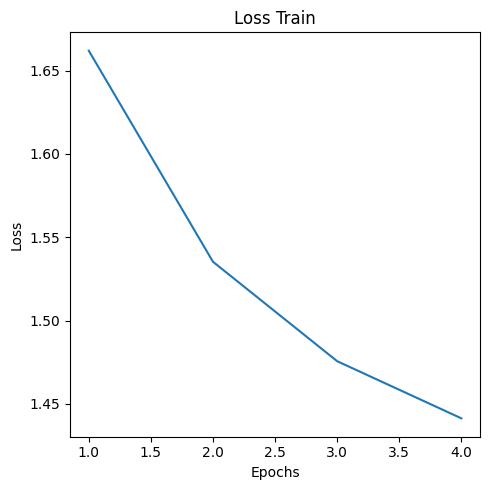

In [27]:
# plot the train loss
fig, ax = plt.subplots(figsize=(5, 5))
ax.plot(epoch_length, [epoch_losses_mean[i] for i in epoch_length])
ax.set_title('Loss Train')
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
plt.tight_layout()

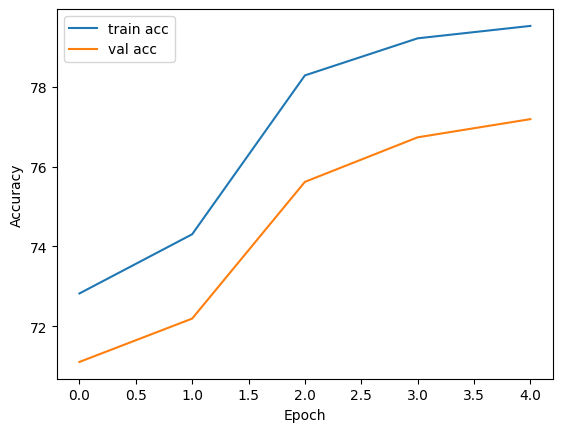

In [28]:
# Plot the training and validation accuracy
plt.plot(train_acc_values, label='train acc')
plt.plot(val_acc_values, label='val acc')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

Now we will use our best model and check it on the test set

In [26]:
model = build_model()
model.load_state_dict(torch.load("/content/drive/MyDrive/checkpoints/model_batch128_5")["net"])
model = model.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [27]:
batch_size=16
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)



In [28]:
# Evaluation on the test set
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_dataloader:
        images = images.to(device)
        labels = labels.to(device)

        output = model(images)
        _, predicted = torch.max(output.data, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = 100 * correct / total
print(f"Test Accuracy: {accuracy}%")


Test Accuracy: 84.8809813957267%


Now we will add gausian noise to see what is the influence of the gausian noise on the results on the test accuracy

In [30]:
# adding noise to the test image
a = [0.05,0.01,0.005]

total=0;
correct=0;
for i in a:
    with torch.no_grad():
        for images, labels in test_dataloader:
            noise_images = images + i* torch.randn(images.size())
            images = noise_images.to(device)
            labels = labels.to(device)


            output = model(images)
            _, predicted = torch.max(output.data, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            #print(total)

        accuracy = 100 * correct / total
        print(f"Test Accuracy for a= {i}: {accuracy}%")

Test Accuracy for a= 0.05: 76.32626533430823%
Test Accuracy for a= 0.01: 80.28678202940938%
Test Accuracy for a= 0.005: 81.77214504292252%


We can see that the test accuracy has not improved. It decreases the test accuracy. We wanted to see what will happen if we add gausian noise in order to understand if we can generalize our model.

Now we will try to add some augmentation and retrain our model in order to see the affect of the augmentation on the test acuuracy


In [31]:
from kornia import augmentation as K
from kornia.augmentation import AugmentationSequential

In [32]:
batch_size = 32
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [33]:
# define a sequence of augmentations
aug_list = AugmentationSequential(
 K.ColorJitter(0.1, 0.1, 0.1, 0.1, p=0.1),
#  K.RandomAffine(360, [0.1, 0.1], [0.7, 1.2], [30., 50.], p=0.1),
#  K.RandomPerspective(0.5, p=0.15),
 #return_transform=False,
 same_on_batch=False,
)

# we'll train again our model
epoch_losses_mean = {}
epoch_length = np.arange(1, 5, 1)
for epoch in range(1, num_epochs + 1):
    model.train()
    Counter_loss = 0
    for images, labels in train_dataloader:
        images = aug_list(images).to(device)
        labels = labels.to(device)
        output = model(images)
        loss = criterion(output, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        Counter_loss += loss.item()

    print(f"Epoch {epoch}/{num_epochs} - Loss: {Counter_loss/len(train_dataloader)}")
    epoch_losses_mean[epoch] = Counter_loss/len(train_dataloader)

# Evaluation
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_dataloader:
        images = images.to(device)
        labels = labels.to(device)

        output = model(images)
        _, predicted = torch.max(output.data, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = 100 * correct / total
print(f"Test Accuracy: {accuracy}%")





In [36]:

df = pd.read_csv("/content/drive/MyDrive/run_data_augmentation.csv")
epoch_losses_mean = df["epoch_losses_mean"].tolist()
epoch_length = np.arange(1,len(epoch_losses_mean),1)

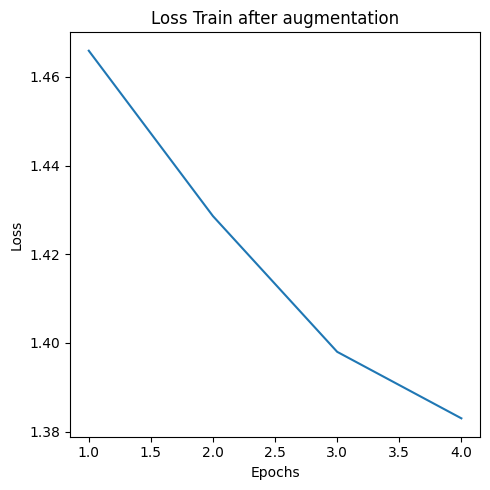

In [37]:
# plot the train loss
fig, ax = plt.subplots(figsize=(5, 5))
ax.plot(epoch_length, [epoch_losses_mean[i] for i in epoch_length])
ax.set_title('Loss Train after augmentation')
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
plt.tight_layout()

We can see that the test accuracy after adding the augmentation has not been improved but it may add robustness to our model and may improve the regularization.

In the end we want to add for test set our hands to see the test accuracy of our model on different dataset

In [30]:
Our_dataset=True

In [31]:
# Define data transformations
data_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])




In [32]:
my_dataset = ImageDataset('/content/drive/MyDrive/our dataset', transform=data_transform, our_dataset =Our_dataset )
len(my_dataset)


72

Top 3 Predictions:
Class Index: 0 Prediction Value: 4.581284046173096
Class Index: 4 Prediction Value: 3.756850481033325
Class Index: 17 Prediction Value: 2.5426647663116455


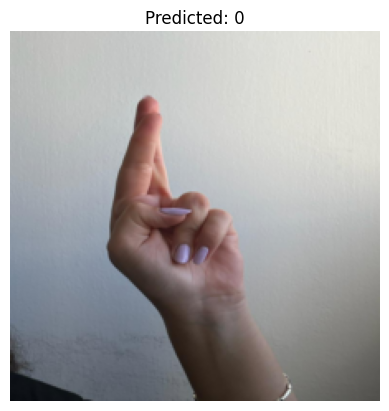

Top 3 Predictions:
Class Index: 2 Prediction Value: 26.965503692626953
Class Index: 13 Prediction Value: 20.951765060424805
Class Index: 11 Prediction Value: 12.814891815185547


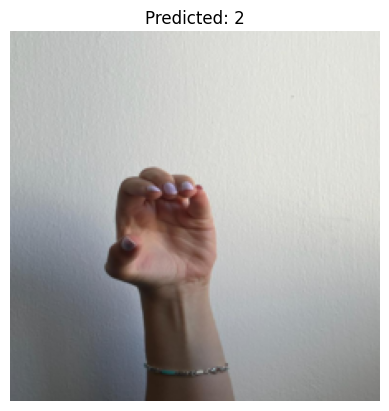

Top 3 Predictions:
Class Index: 0 Prediction Value: 7.433744430541992
Class Index: 1 Prediction Value: 3.09550142288208
Class Index: 15 Prediction Value: 1.7998040914535522


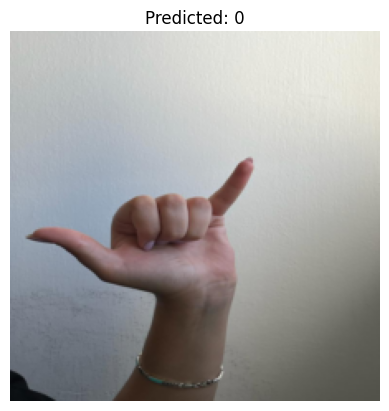

Top 3 Predictions:
Class Index: 0 Prediction Value: 9.189913749694824
Class Index: 18 Prediction Value: 4.132981777191162
Class Index: 11 Prediction Value: 4.100265979766846


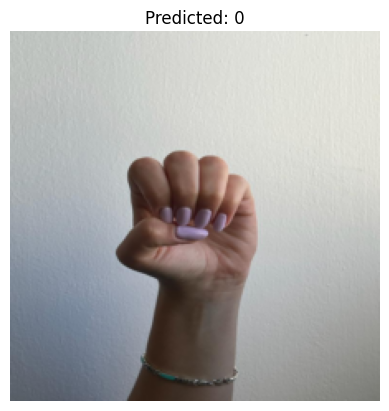

Top 3 Predictions:
Class Index: 5 Prediction Value: 4.163703441619873
Class Index: 1 Prediction Value: 2.364347219467163
Class Index: 23 Prediction Value: 1.9759721755981445


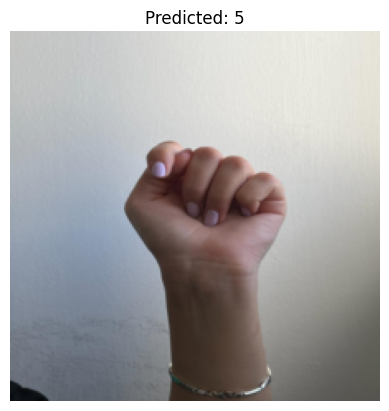

Top 3 Predictions:
Class Index: 5 Prediction Value: 11.877765655517578
Class Index: 23 Prediction Value: 6.137747287750244
Class Index: 9 Prediction Value: 3.5176968574523926


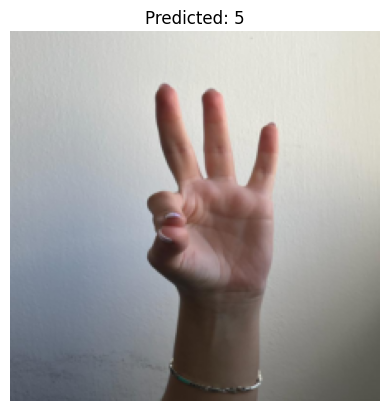

Top 3 Predictions:
Class Index: 2 Prediction Value: 21.220117568969727
Class Index: 13 Prediction Value: 17.40195655822754
Class Index: 11 Prediction Value: 11.059529304504395


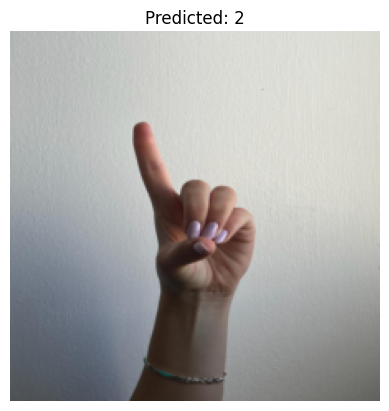

Top 3 Predictions:
Class Index: 7 Prediction Value: 3.541076898574829
Class Index: 6 Prediction Value: 3.110818386077881
Class Index: 0 Prediction Value: 1.97166109085083


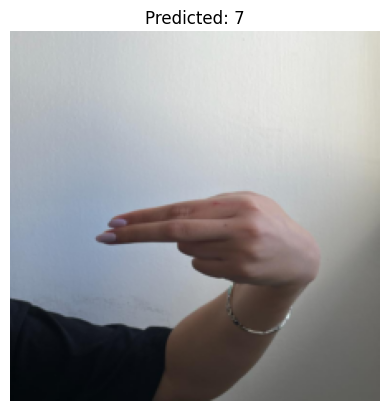

Top 3 Predictions:
Class Index: 0 Prediction Value: 4.173996925354004
Class Index: 3 Prediction Value: 3.4513118267059326
Class Index: 1 Prediction Value: 2.995535373687744


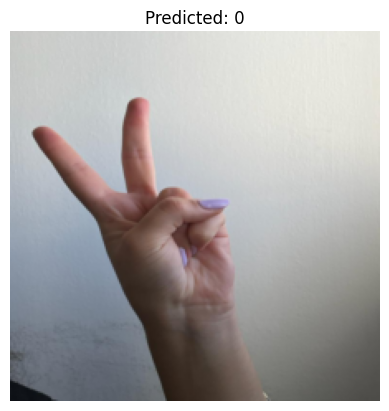

Top 3 Predictions:
Class Index: 13 Prediction Value: 32.50103759765625
Class Index: 2 Prediction Value: 32.14824295043945
Class Index: 11 Prediction Value: 24.36612892150879


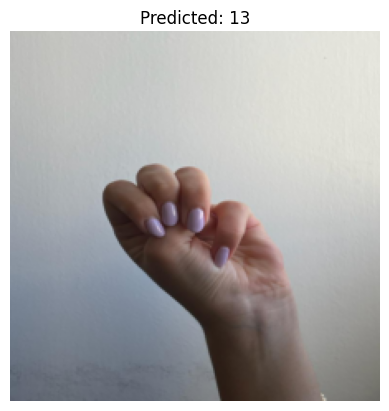

Top 3 Predictions:
Class Index: 2 Prediction Value: 9.778386116027832
Class Index: 13 Prediction Value: 7.472253322601318
Class Index: 11 Prediction Value: 5.079126358032227


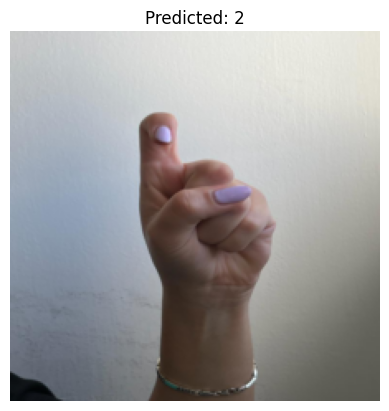

Top 3 Predictions:
Class Index: 2 Prediction Value: 18.672243118286133
Class Index: 13 Prediction Value: 14.96251392364502
Class Index: 11 Prediction Value: 8.972124099731445


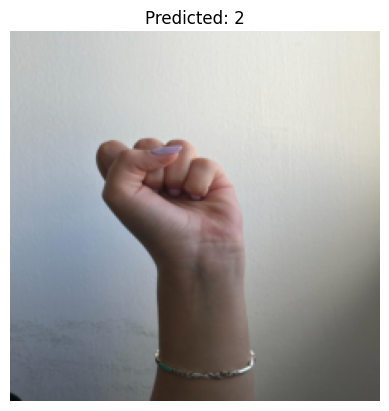

Top 3 Predictions:
Class Index: 13 Prediction Value: 4.283543109893799
Class Index: 2 Prediction Value: 3.8833584785461426
Class Index: 11 Prediction Value: 3.091343879699707


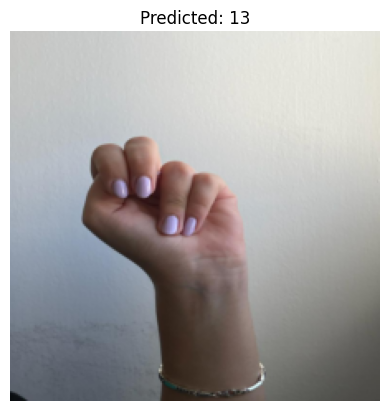

Top 3 Predictions:
Class Index: 0 Prediction Value: 7.253036022186279
Class Index: 2 Prediction Value: 3.3844733238220215
Class Index: 4 Prediction Value: 2.490434408187866


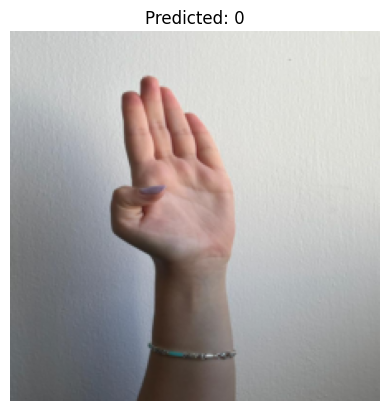

Top 3 Predictions:
Class Index: 0 Prediction Value: 5.695214748382568
Class Index: 15 Prediction Value: 3.4571526050567627
Class Index: 6 Prediction Value: 3.1063685417175293


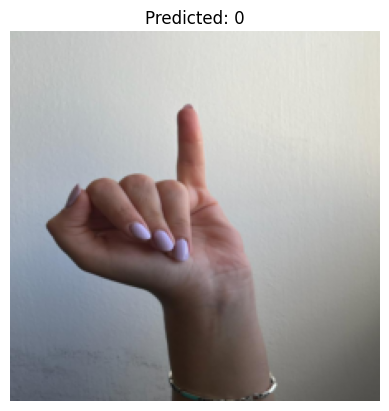

Top 3 Predictions:
Class Index: 0 Prediction Value: 3.859501838684082
Class Index: 4 Prediction Value: 3.2905683517456055
Class Index: 2 Prediction Value: 2.1100096702575684


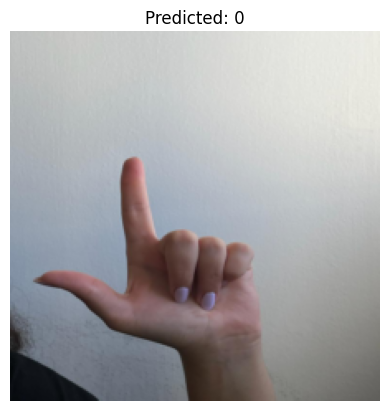

Top 3 Predictions:
Class Index: 2 Prediction Value: 28.48826789855957
Class Index: 13 Prediction Value: 23.09101676940918
Class Index: 11 Prediction Value: 14.42592716217041


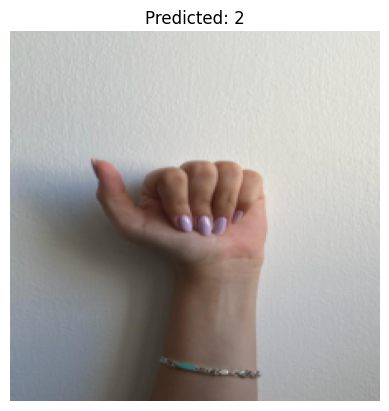

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.730120658874512
Class Index: 17 Prediction Value: 6.010636806488037
Class Index: 11 Prediction Value: 4.91558313369751


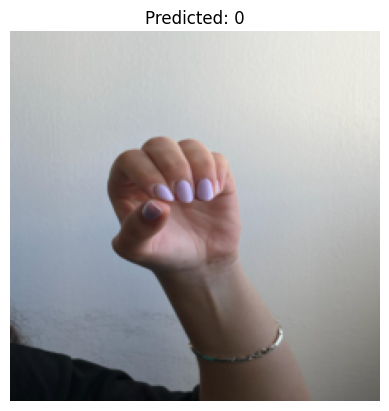

Top 3 Predictions:
Class Index: 0 Prediction Value: 4.193161964416504
Class Index: 1 Prediction Value: 2.237977981567383
Class Index: 23 Prediction Value: 2.1765317916870117


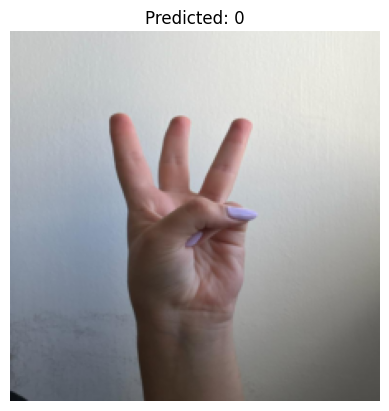

Top 3 Predictions:
Class Index: 6 Prediction Value: 3.0503556728363037
Class Index: 5 Prediction Value: 2.4422073364257812
Class Index: 2 Prediction Value: 1.8304659128189087


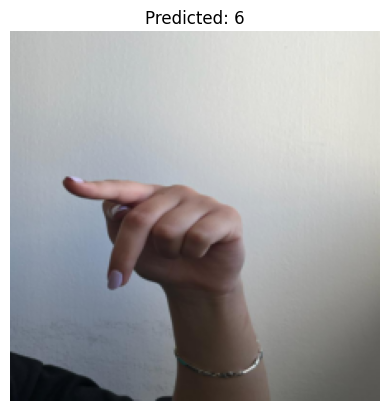

Top 3 Predictions:
Class Index: 0 Prediction Value: 5.438604354858398
Class Index: 4 Prediction Value: 3.975837469100952
Class Index: 17 Prediction Value: 2.8707730770111084


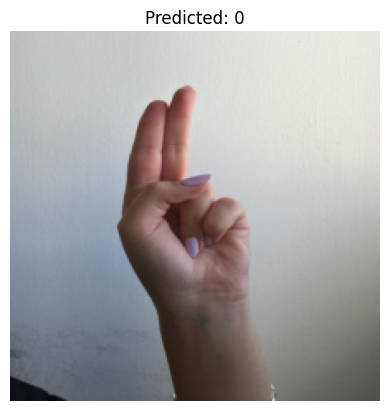

Top 3 Predictions:
Class Index: 0 Prediction Value: 4.528122901916504
Class Index: 7 Prediction Value: 3.5811407566070557
Class Index: 6 Prediction Value: 3.1549766063690186


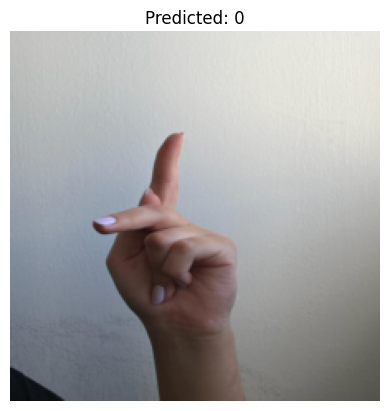

Top 3 Predictions:
Class Index: 0 Prediction Value: 5.793488025665283
Class Index: 15 Prediction Value: 4.23452615737915
Class Index: 13 Prediction Value: 3.202624559402466


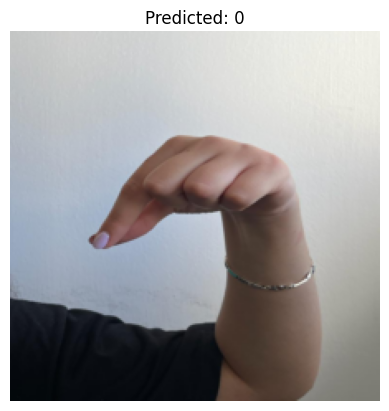

Top 3 Predictions:
Class Index: 7 Prediction Value: 4.611602306365967
Class Index: 0 Prediction Value: 4.164562225341797
Class Index: 15 Prediction Value: 3.025359869003296


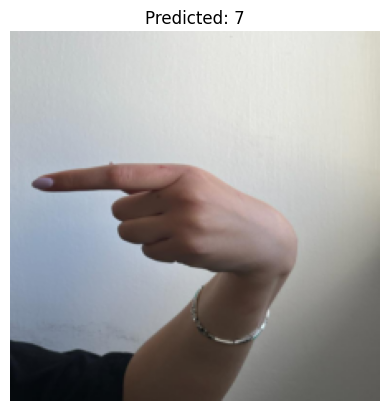

Top 3 Predictions:
Class Index: 0 Prediction Value: 5.812744140625
Class Index: 7 Prediction Value: 5.101970195770264
Class Index: 6 Prediction Value: 4.607705593109131


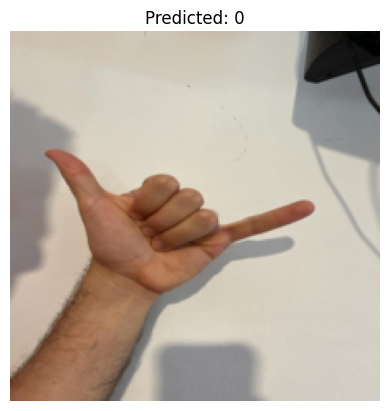

Top 3 Predictions:
Class Index: 0 Prediction Value: 5.186553001403809
Class Index: 2 Prediction Value: 2.6336965560913086
Class Index: 23 Prediction Value: 2.2415618896484375


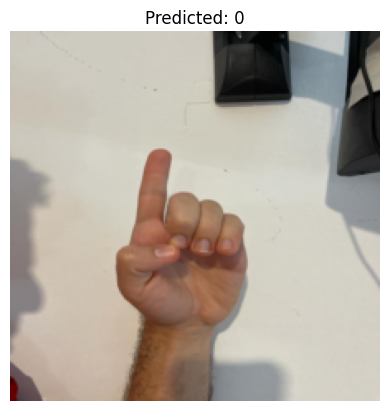

Top 3 Predictions:
Class Index: 2 Prediction Value: 25.21060562133789
Class Index: 1 Prediction Value: 24.982316970825195
Class Index: 7 Prediction Value: 20.93917465209961


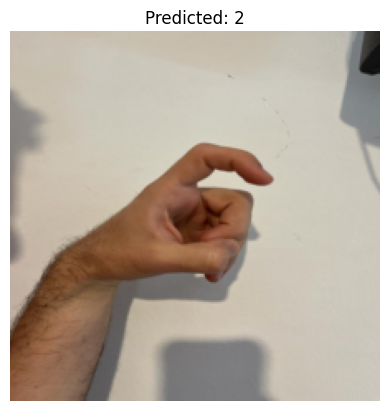

Top 3 Predictions:
Class Index: 0 Prediction Value: 4.840231895446777
Class Index: 6 Prediction Value: 4.130263805389404
Class Index: 7 Prediction Value: 3.9508538246154785


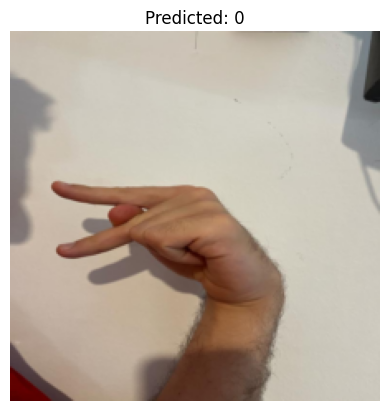

Top 3 Predictions:
Class Index: 0 Prediction Value: 5.586102485656738
Class Index: 7 Prediction Value: 3.966634750366211
Class Index: 6 Prediction Value: 3.1275475025177


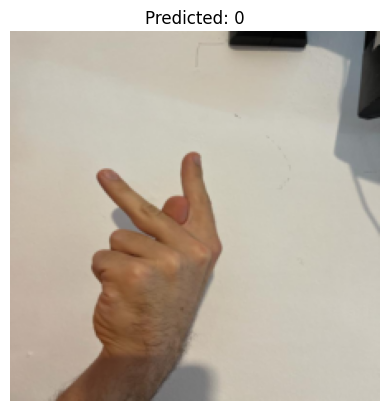

Top 3 Predictions:
Class Index: 5 Prediction Value: 21.50786018371582
Class Index: 23 Prediction Value: 15.960322380065918
Class Index: 9 Prediction Value: 9.983193397521973


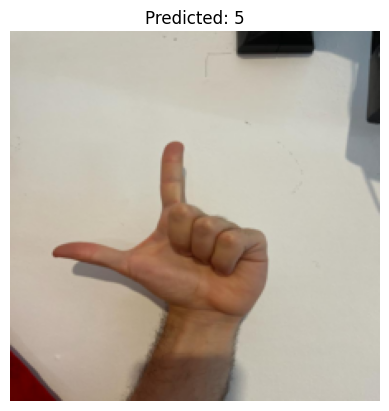

Top 3 Predictions:
Class Index: 0 Prediction Value: 5.821719169616699
Class Index: 4 Prediction Value: 2.8074700832366943
Class Index: 1 Prediction Value: 2.5454249382019043


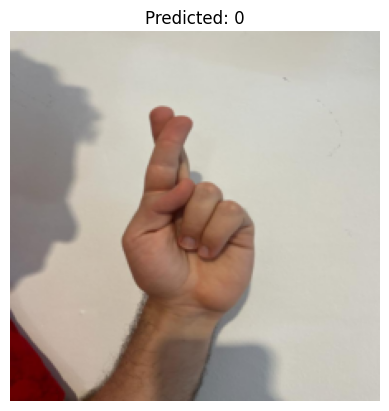

Top 3 Predictions:
Class Index: 6 Prediction Value: 4.910120487213135
Class Index: 7 Prediction Value: 4.820451259613037
Class Index: 0 Prediction Value: 4.045255184173584


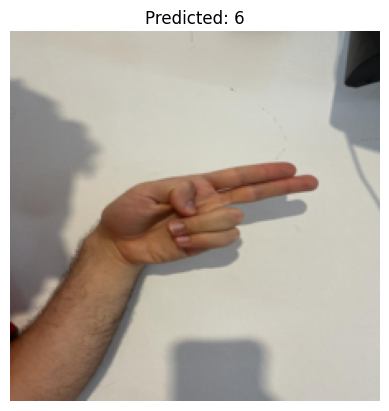

Top 3 Predictions:
Class Index: 0 Prediction Value: 7.4988179206848145
Class Index: 1 Prediction Value: 2.6976425647735596
Class Index: 2 Prediction Value: 2.6567089557647705


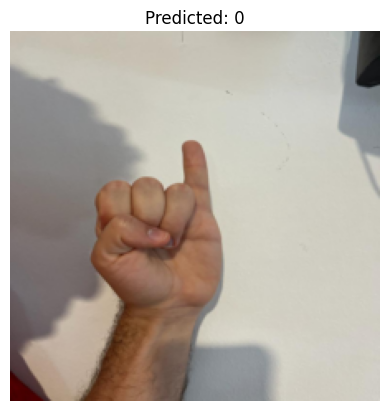

Top 3 Predictions:
Class Index: 5 Prediction Value: 5.228586196899414
Class Index: 0 Prediction Value: 2.560460329055786
Class Index: 23 Prediction Value: 2.4372715950012207


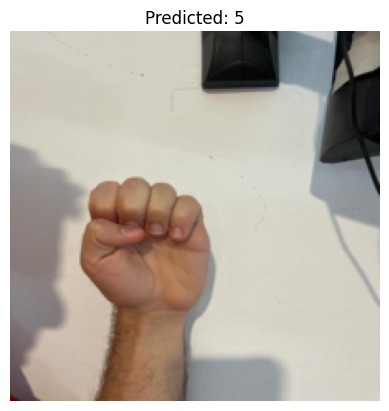

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.892871856689453
Class Index: 1 Prediction Value: 3.0474298000335693
Class Index: 15 Prediction Value: 2.683314800262451


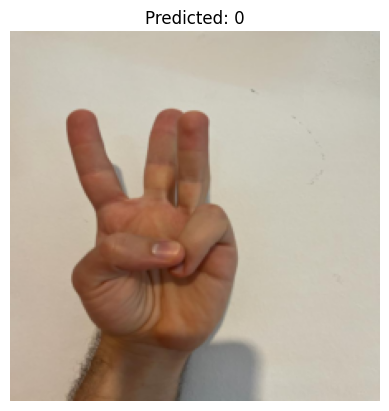

Top 3 Predictions:
Class Index: 0 Prediction Value: 8.006136894226074
Class Index: 1 Prediction Value: 3.547879219055176
Class Index: 15 Prediction Value: 3.110546112060547


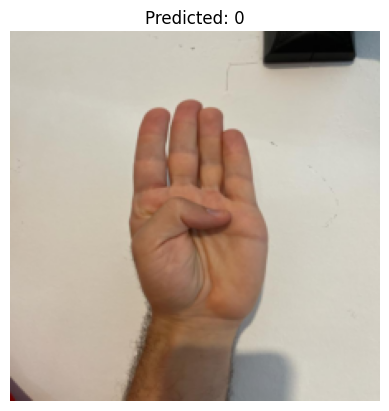

Top 3 Predictions:
Class Index: 0 Prediction Value: 3.389418601989746
Class Index: 4 Prediction Value: 3.0386569499969482
Class Index: 15 Prediction Value: 2.9020400047302246


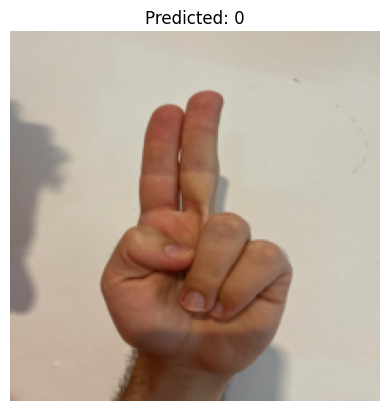

Top 3 Predictions:
Class Index: 23 Prediction Value: 3.5411651134490967
Class Index: 0 Prediction Value: 3.2947261333465576
Class Index: 2 Prediction Value: 3.1743581295013428


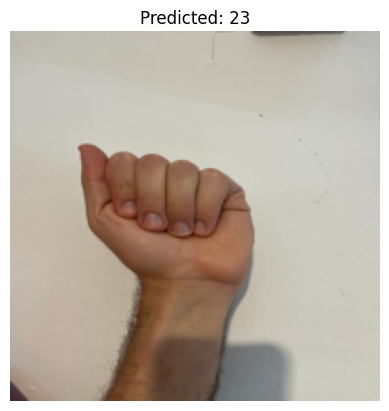

Top 3 Predictions:
Class Index: 0 Prediction Value: 5.200111389160156
Class Index: 15 Prediction Value: 3.482720136642456
Class Index: 17 Prediction Value: 2.905395984649658


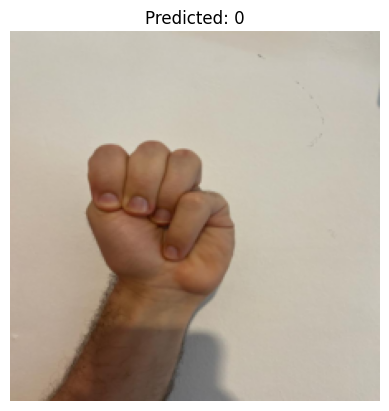

Top 3 Predictions:
Class Index: 5 Prediction Value: 7.312133312225342
Class Index: 23 Prediction Value: 5.630727767944336
Class Index: 2 Prediction Value: 2.1333203315734863


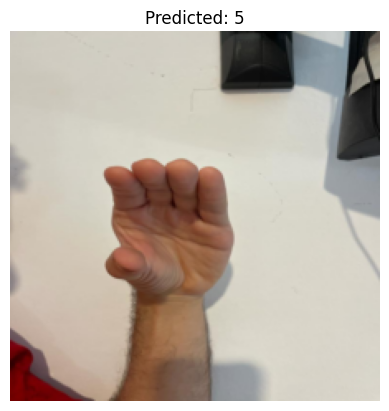

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.028456211090088
Class Index: 17 Prediction Value: 5.338353157043457
Class Index: 11 Prediction Value: 4.454273223876953


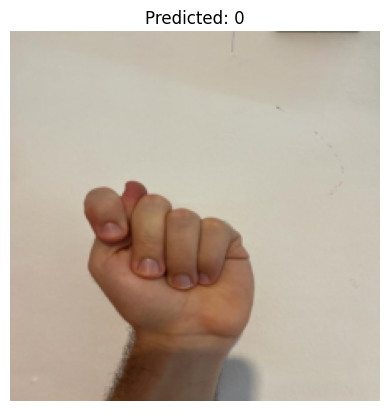

Top 3 Predictions:
Class Index: 5 Prediction Value: 13.2095308303833
Class Index: 23 Prediction Value: 7.3120880126953125
Class Index: 9 Prediction Value: 2.8926260471343994


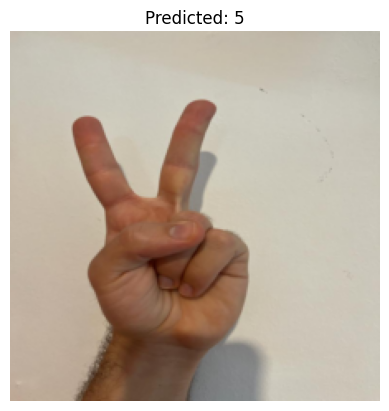

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.890027046203613
Class Index: 15 Prediction Value: 2.9797964096069336
Class Index: 1 Prediction Value: 2.7681758403778076


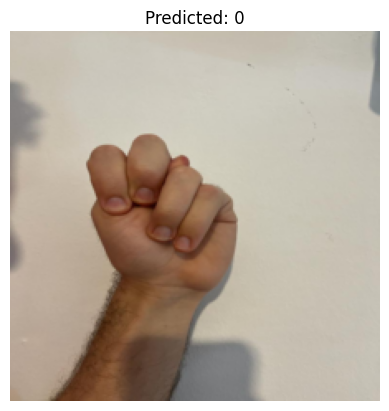

Top 3 Predictions:
Class Index: 6 Prediction Value: 5.311971187591553
Class Index: 0 Prediction Value: 3.454479455947876
Class Index: 9 Prediction Value: 3.0348613262176514


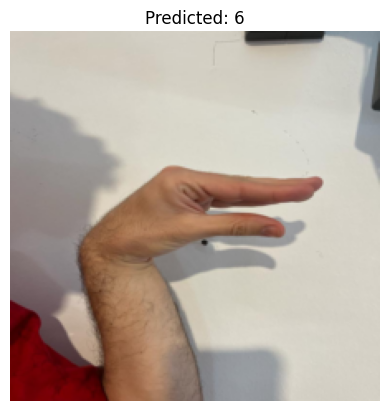

Top 3 Predictions:
Class Index: 0 Prediction Value: 4.8502984046936035
Class Index: 5 Prediction Value: 3.6077661514282227
Class Index: 1 Prediction Value: 3.154660940170288


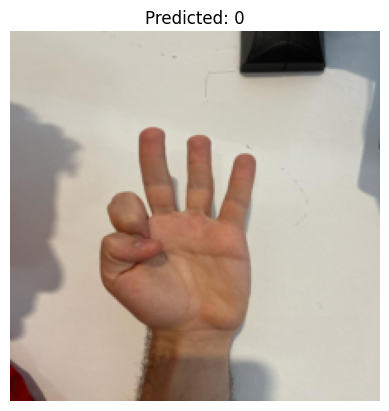

Top 3 Predictions:
Class Index: 2 Prediction Value: 11.947380065917969
Class Index: 13 Prediction Value: 9.470630645751953
Class Index: 11 Prediction Value: 6.013600826263428


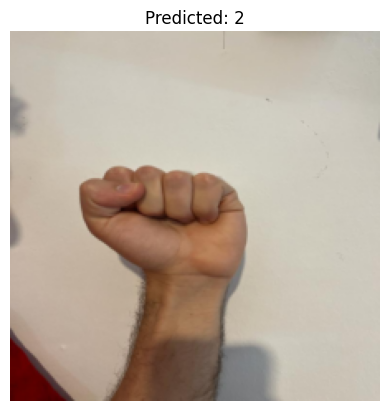

Top 3 Predictions:
Class Index: 7 Prediction Value: 12.131630897521973
Class Index: 2 Prediction Value: 12.097139358520508
Class Index: 0 Prediction Value: 10.497660636901855


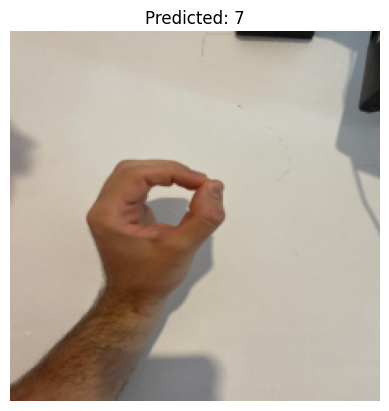

Top 3 Predictions:
Class Index: 6 Prediction Value: 6.236161231994629
Class Index: 7 Prediction Value: 5.232517719268799
Class Index: 0 Prediction Value: 3.2573158740997314


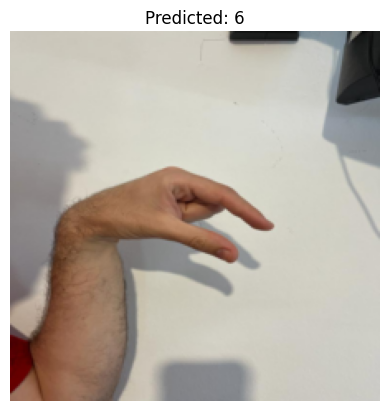

Top 3 Predictions:
Class Index: 23 Prediction Value: 4.945512294769287
Class Index: 5 Prediction Value: 3.18141508102417
Class Index: 10 Prediction Value: 2.2010819911956787


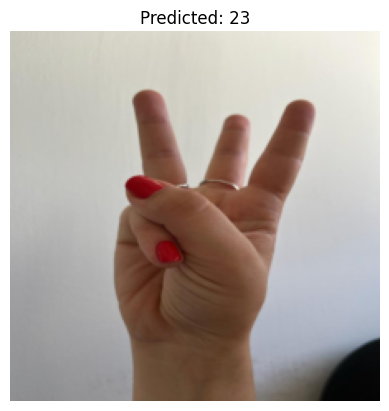

Top 3 Predictions:
Class Index: 0 Prediction Value: 4.849454402923584
Class Index: 4 Prediction Value: 2.7797048091888428
Class Index: 2 Prediction Value: 2.371858835220337


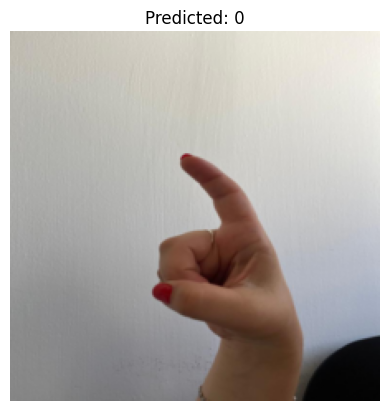

Top 3 Predictions:
Class Index: 0 Prediction Value: 5.946423053741455
Class Index: 4 Prediction Value: 4.006885051727295
Class Index: 2 Prediction Value: 2.845655679702759


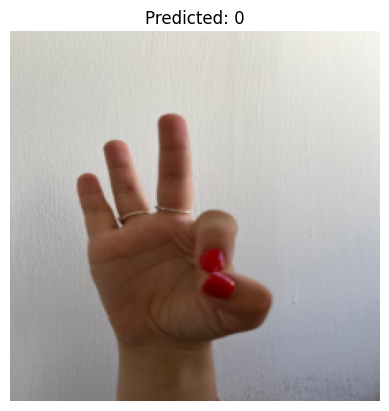

Top 3 Predictions:
Class Index: 0 Prediction Value: 7.601229667663574
Class Index: 11 Prediction Value: 2.8058691024780273
Class Index: 4 Prediction Value: 2.6326637268066406


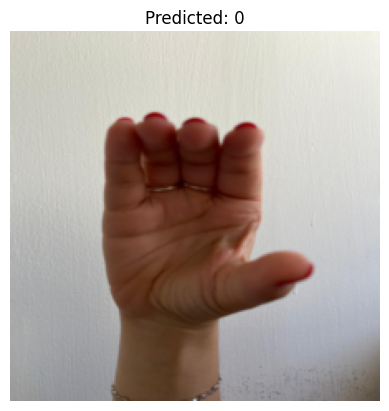

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.400820255279541
Class Index: 2 Prediction Value: 4.026172637939453
Class Index: 1 Prediction Value: 3.0069851875305176


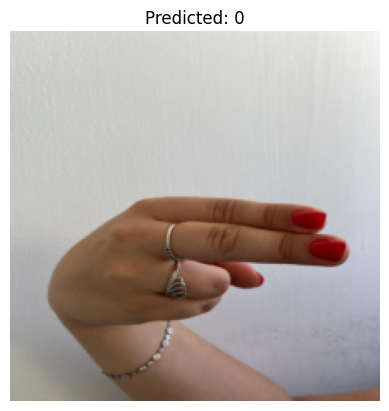

Top 3 Predictions:
Class Index: 13 Prediction Value: 8.966287612915039
Class Index: 11 Prediction Value: 8.426285743713379
Class Index: 2 Prediction Value: 7.466579914093018


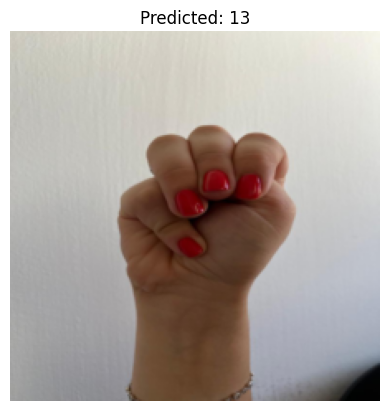

Top 3 Predictions:
Class Index: 11 Prediction Value: 8.978301048278809
Class Index: 13 Prediction Value: 7.991947174072266
Class Index: 17 Prediction Value: 7.137775897979736


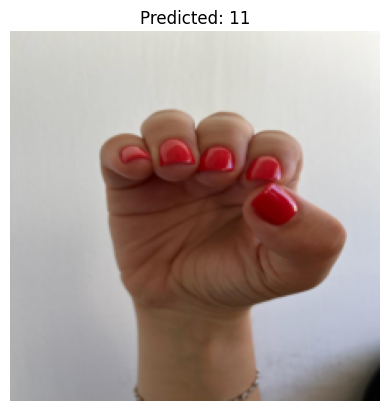

Top 3 Predictions:
Class Index: 5 Prediction Value: 13.326151847839355
Class Index: 23 Prediction Value: 5.646533012390137
Class Index: 1 Prediction Value: 2.6651291847229004


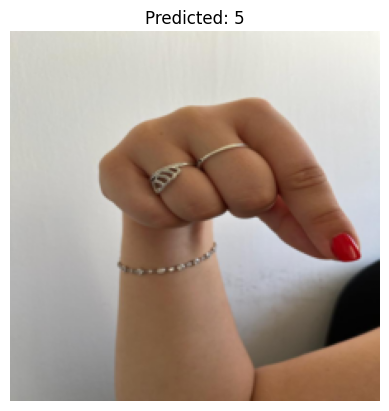

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.346065044403076
Class Index: 17 Prediction Value: 4.6260480880737305
Class Index: 4 Prediction Value: 4.623581409454346


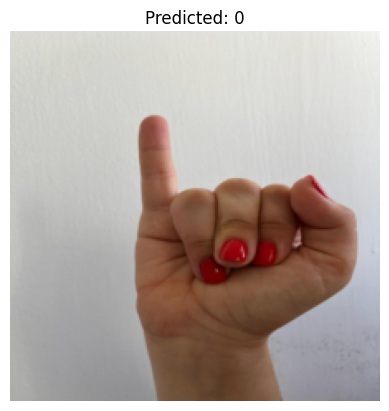

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.260730743408203
Class Index: 4 Prediction Value: 3.7839064598083496
Class Index: 15 Prediction Value: 2.8598010540008545


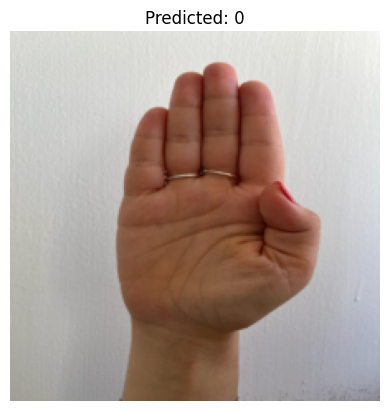

Top 3 Predictions:
Class Index: 0 Prediction Value: 5.480713367462158
Class Index: 4 Prediction Value: 5.302500247955322
Class Index: 17 Prediction Value: 4.651814937591553


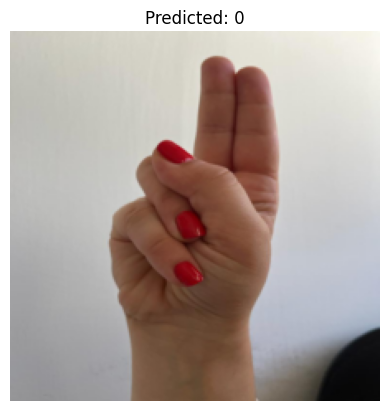

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.527421951293945
Class Index: 15 Prediction Value: 3.467973232269287
Class Index: 7 Prediction Value: 2.941873788833618


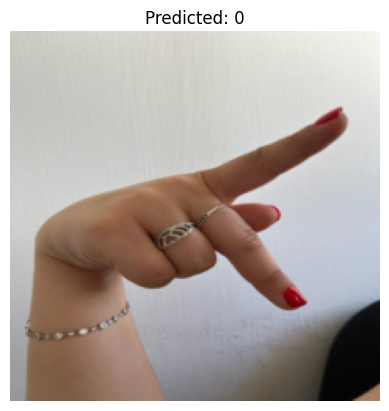

Top 3 Predictions:
Class Index: 0 Prediction Value: 4.465909004211426
Class Index: 4 Prediction Value: 3.0364556312561035
Class Index: 1 Prediction Value: 2.0779922008514404


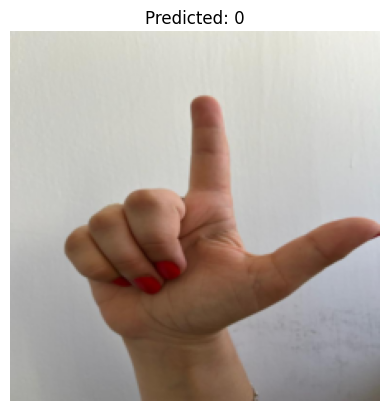

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.767670631408691
Class Index: 1 Prediction Value: 2.2923898696899414
Class Index: 4 Prediction Value: 2.272969961166382


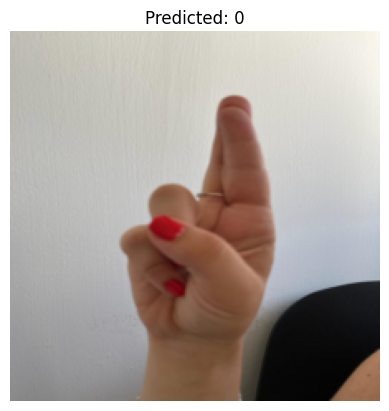

Top 3 Predictions:
Class Index: 17 Prediction Value: 5.699617862701416
Class Index: 13 Prediction Value: 5.622269630432129
Class Index: 11 Prediction Value: 5.283199787139893


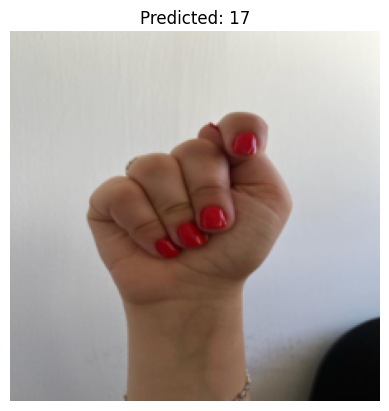

Top 3 Predictions:
Class Index: 0 Prediction Value: 7.183508396148682
Class Index: 11 Prediction Value: 6.193408012390137
Class Index: 18 Prediction Value: 5.140933513641357


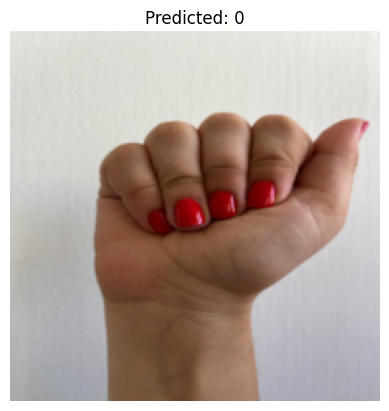

Top 3 Predictions:
Class Index: 0 Prediction Value: 4.221766948699951
Class Index: 23 Prediction Value: 3.257023334503174
Class Index: 4 Prediction Value: 1.9254519939422607


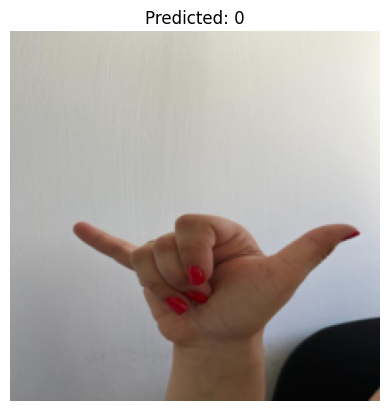

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.813100337982178
Class Index: 11 Prediction Value: 2.9488234519958496
Class Index: 17 Prediction Value: 2.8673810958862305


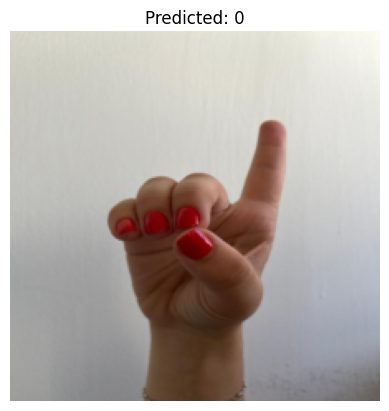

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.495056629180908
Class Index: 15 Prediction Value: 3.441051721572876
Class Index: 2 Prediction Value: 2.643861770629883


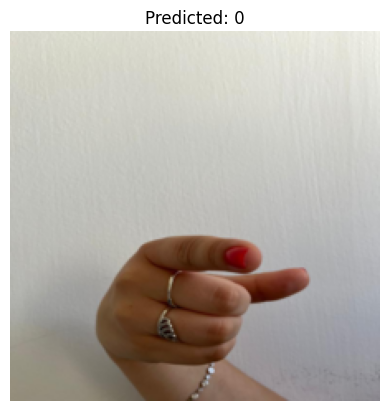

Top 3 Predictions:
Class Index: 11 Prediction Value: 5.63903284072876
Class Index: 13 Prediction Value: 5.555064678192139
Class Index: 17 Prediction Value: 5.53012228012085


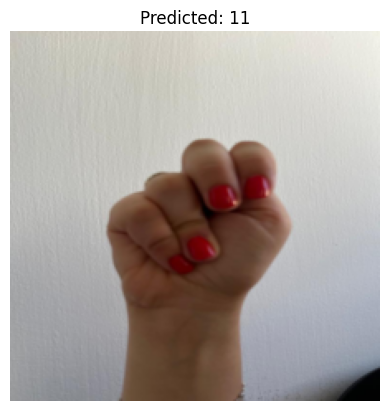

Top 3 Predictions:
Class Index: 11 Prediction Value: 17.066186904907227
Class Index: 13 Prediction Value: 13.671306610107422
Class Index: 18 Prediction Value: 9.229127883911133


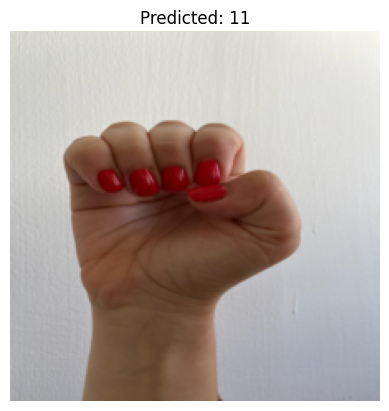

Top 3 Predictions:
Class Index: 23 Prediction Value: 4.172520637512207
Class Index: 0 Prediction Value: 3.8897414207458496
Class Index: 10 Prediction Value: 2.0238752365112305


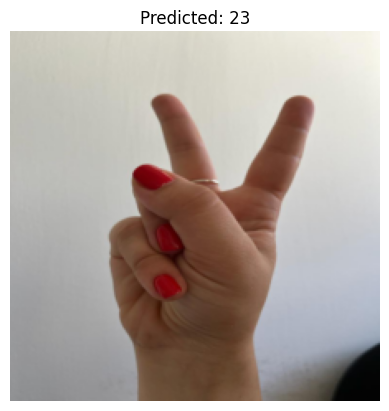

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.058285713195801
Class Index: 1 Prediction Value: 3.3936328887939453
Class Index: 2 Prediction Value: 2.517576217651367


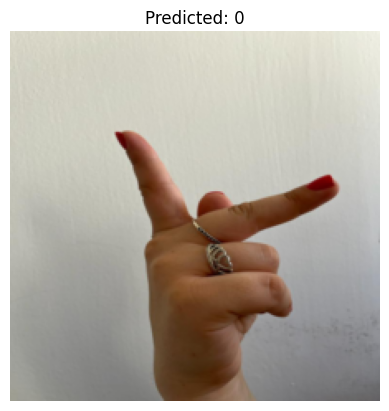

Top 3 Predictions:
Class Index: 0 Prediction Value: 6.567444324493408
Class Index: 4 Prediction Value: 4.102993965148926
Class Index: 17 Prediction Value: 3.9500157833099365


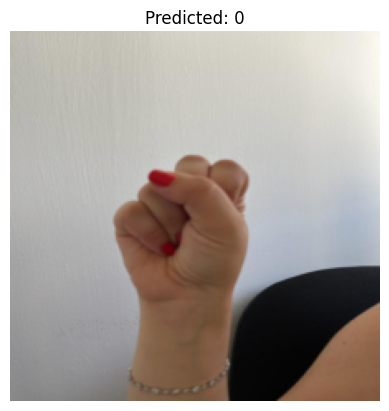

In [39]:
model.eval()

with torch.no_grad():
    for images in my_dataset:
      images=images.unsqueeze(0)
      images = images.to(device)
      output = model(images)
      _, predicted = torch.max(output.data, 1)
      # Get the top 3 predictions and their corresponding indices
      top_k_values, top_k_indices = torch.topk(output.data, k=3)
      # Convert the tensors to lists for easier access
      top_k_values = top_k_values.squeeze().tolist()
      top_k_indices = top_k_indices.squeeze().tolist()
      print("Top 3 Predictions:")
      for value, index in zip(top_k_values, top_k_indices):
          print("Class Index:", index, "Prediction Value:", value)
      image_np = images.squeeze().cpu().numpy()
      image_np = np.transpose(image_np, (1, 2, 0))
      plt.imshow(image_np)
      plt.title(f"Predicted: {predicted.item()}")
      plt.axis('off')
      plt.show()

